<a href="https://colab.research.google.com/github/hisham32/DhakaAI-yolov5/blob/master/DhakaAI_YOLOv5_Training%2BEvaluation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

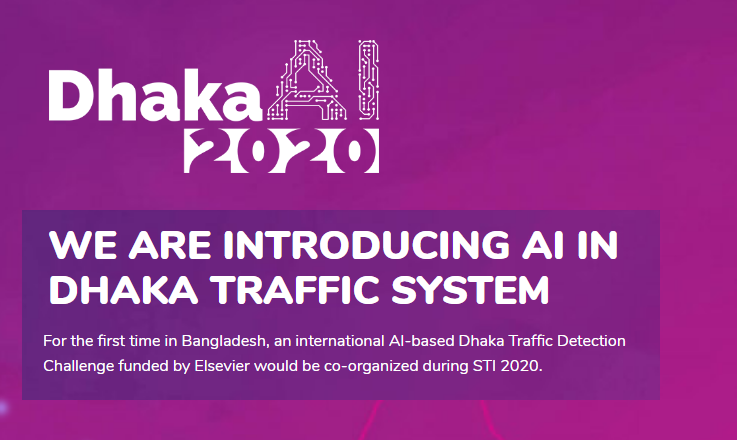



# Dhaka Traffic Detection using YOLOv5

This notebook contains Ultralytics inference and training code for YOLOv5. 

If you dont want to train the dataset you can simply skip to inference part.

## Setup 
We have configure the YOLOV5 Ultralytics repository to train the traffic dataset. In this example we are going to use 30% of the dataset for training and testing.

In [ ]:
# importing necessary libraries for file handling
import os
import glob
import shutil

In [ ]:
# Connecting colab to google drive for uploading data to colab 
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# creating directories according to yolov5 requirement
os.mkdir('dhakaai')
%cd dhakaai
os.mkdir('images')
os.mkdir('labels')
%cd labels
os.mkdir('train')
os.mkdir('valid')
os.mkdir('test')
%cd '/content'

/content/dhakaai
/content/dhakaai/labels
/content


In [ ]:
# downloading processed training and testing data 
from IPython.display import Image, clear_output

!gdown --id 13SFjxqtf3UCGmDKDBl7EX-VFE1gHu1qT # downloading training, validation and test data round-1
!rm -rf '/content/test' # deleting 1st round test data as this is not labeled
!gdown --id 1GagUDerqNxYqpNs_k25a_uXU6R4KOPEt # downloading test data round-2 labeled by our team for internal evaluation
!unzip dhaka-traffic-yolo-v3_seed_401.zip; rm dhaka-traffic-yolo-v3_seed_401.zip;
!unzip test2.zip; rm test2.zip;
clear_output()

In [ ]:
# moving data for yolov5 model training and testing purpose
files1=glob.glob(os.path.join("/content/train/", "*.txt"))
files2=glob.glob(os.path.join("/content/valid/", "*.txt"))
files0=glob.glob(os.path.join("/content/test/", "*.txt"))

for f1 in files1:
      shutil.move(f1, "/content/dhakaai/labels/train")
shutil.move("/content/train", "/content/dhakaai/images/")

for f2 in files2:
      shutil.move(f2, "/content/dhakaai/labels/valid")
shutil.move("/content/valid", "/content/dhakaai/images/")

for f0 in files0:
      shutil.move(f0, "/content/dhakaai/labels/test")
shutil.move("/content/test", "/content/dhakaai/images/")

clear_output()

In [ ]:
# cloning the yolov5 repository containing our evolved hyperparameters 
# hyperparamters were evolved on the training data for about 3 weeks for different yolov5 models (s,m,l,x) and optimizers (adam, sgd) 
!git clone https://github.com/hisham32/DhakaAI-yolov5.git
%cd yolov5
!pip install -r requirements.txt
import torch

Cloning into 'yolov5'...
remote: Enumerating objects: 2798, done.
remote: Total 2798 (delta 0), reused 0 (delta 0), pack-reused 2798
Receiving objects: 100% (2798/2798), 6.02 MiB | 20.82 MiB/s, done.
Resolving deltas: 100% (1845/1845), done.
/content/yolov5
     |████████████████████████████████| 276kB 7.1MB/s 
  Created wheel for PyYAML: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44619 sha256=63fbdd1d1b9ec8a35133d29d68fdefd254d944728eef7f86ecd0e0f0d9b13343
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
Successfully built PyYAML
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


# Training

In [ ]:
#https://www.wandb.com/
#!pip install wandb

In [ ]:
# !!! Do not run this if you want to resume uninterrupted training !!!
# only run this if you are just starting training
# use weights s,m,l,x in the weights option, here s is used
# give the path in logdir option where you want to save your weights in drive, will be useful in resuming interrupted training
!python train.py --img 1024 --batch 8 \
                 --epochs 600 --data dhakaai.yaml --weights yolov5m.pt --hyp '/content/yolov5/data/hyp_evolved.yaml' \
                 --cache --logdir '/content/drive/My Drive/mediumevol'

Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Namespace(adam=False, batch_size=8, bucket='', cache_images=True, cfg='', data='./data/dhakaai.yaml', device='', epochs=600, evolve=False, global_rank=-1, hyp='/content/yolov5/data/hyp_evolved.yaml', image_weights=False, img_size=[1024, 1024], local_rank=-1, log_imgs=10, logdir='/content/drive/My Drive/mediumevol', multi_scale=False, name='', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=8, weights='yolov5m.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir /content/drive/My Drive/mediumevol", view at http://localhost:6006/
2020-11-26 00:12:23.168573: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Install Weights & Biases for experiment logging via 'pip install wandb' (recommended)
Hyperparameters {'lr0': 0.0167, 'lrf': 0.19

In [ ]:
# !!! Do not run this if you want to start training from beginning !!!
# run only if you want to resume interrupted training
# find the last exp in the runs folder saved in drive and change the path in the following code accordingly
!python train.py --resume '/content/drive/My Drive/mediumevol/exp0/weights/last.pt'

Resuming training from /content/drive/My Drive/mediumevol/exp0/weights/last.pt
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Namespace(adam=False, batch_size=8, bucket='', cache_images=True, cfg='', data='./data/dhakaai.yaml', device='', epochs=600, evolve=False, global_rank=-1, hyp='/content/yolov5/data/hyp_evolved.yaml', image_weights=False, img_size=[1024, 1024], local_rank=-1, log_imgs=0, logdir='/content/drive/My Drive/mediumevol', multi_scale=False, name='', noautoanchor=False, nosave=False, notest=False, rect=False, resume=True, single_cls=False, sync_bn=False, total_batch_size=8, weights='/content/drive/My Drive/mediumevol/exp0/weights/last.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir /content/drive/My Drive/mediumevol", view at http://localhost:6006/
2020-11-26 23:48:42.900564: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Install

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir '/content/drive/My Drive/mediumevol'

<IPython.core.display.Javascript object>

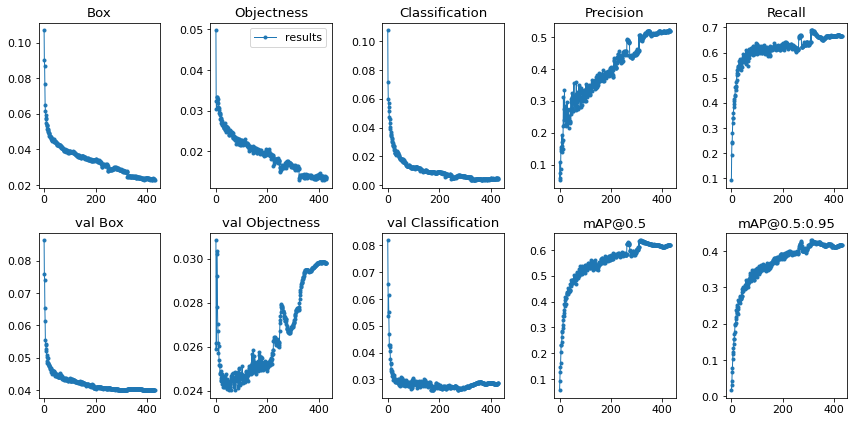

In [ ]:
# run after completing training, change the save_dir accordingly
from utils.general import plot_results 
plot_results(save_dir='/content/drive/My Drive/YOLOv5large_hyp_evolved/exp0')

# Inference

In [ ]:
# the test files are coped to the yolov5 folder to produce inference output
os.mkdir('test')
files3=glob.glob(os.path.join("/content/dhakaai/images/test/", "*"))
for f3 in files3:
    shutil.copy(f3, "/content/yolov5/test/")

In [ ]:
# run inference after completing training, change the weight path accordingly and use best.pt
!python detect.py --img-size 1024 --save-txt\
                  --weights '/content/drive/My Drive/mediumhyp/exp0/weights/best.pt' '/content/drive/My Drive/YOLOv5xtra/exp0/weights/best.pt' \
                  '/content/drive/My Drive/YOLOv5large_adam_hyp_evolved_adam/exp0/weights/best.pt' \
                  '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedadaml_YOLOv5l_Combined_Clean/exp0/weights/best.pt' \
                  '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedadamx_YOLOv5x_Combined_Clean/exp0/weights/best.pt' \
                  '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedsgdl_YOLOv5l_Combined_Clean/exp0/weights/best.pt' \
                  '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedsgdx_YOLOv5x_Combined_Clean/exp0/weights/best.pt'\
                  '/content/drive/My Drive/largehyp/exp0/weights/best.pt' '/content/drive/My Drive/YOLOv5large_hyp_evolved/exp0/weights/best.pt' \
                  '/content/drive/My Drive/YOLOv5xtra_hyp_evolved/exp0/weights/best.pt' '/content/drive/My Drive/YOLOv5xtra_hyp_evolved_adam/exp0/weights/best.pt' \
                  --source test --augment --save-conf --iou-thres 0.6 --conf-thres 0.3

Namespace(agnostic_nms=False, augment=True, classes=None, conf_thres=0.3, device='', img_size=1024, iou_thres=0.6, save_conf=True, save_dir='inference/output', save_txt=True, source='test', update=False, view_img=False, weights=['/content/drive/My Drive/YOLOv5xtra/exp0/weights/best.pt', '/content/drive/My Drive/YOLOv5large_adam_hyp_evolved_adam/exp0/weights/best.pt', '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedadaml_YOLOv5l_Combined_Clean/exp0/weights/best.pt', '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedadamx_YOLOv5x_Combined_Clean/exp0/weights/best.pt', '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedsgdl_YOLOv5l_Combined_Clean/exp0/weights/best.pt', '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedsgdx_YOLOv5x_Combined_Clean/exp0/weights/best.pt', '/content/drive/My Drive/largehyp/exp0/weights/best.pt', '/content/drive/My Drive/YOLOv5large_hyp_evolved/exp0/weights/best.pt', '/content/drive/My Drive/YOLOv5xtra_hyp_evolved/exp0/we

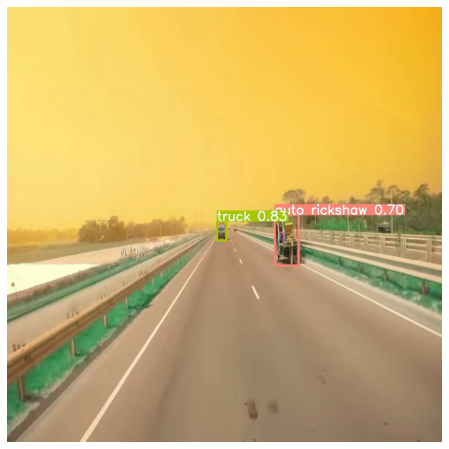

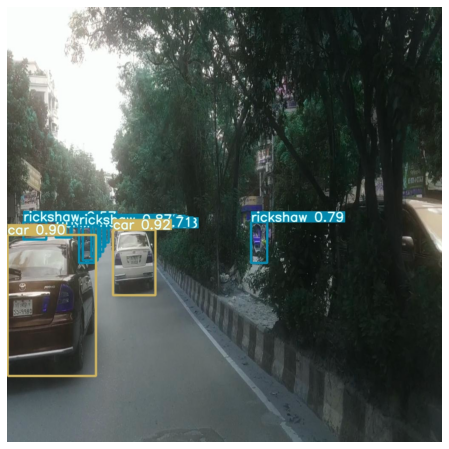

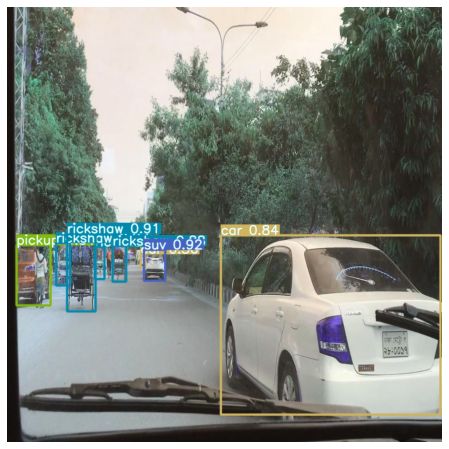

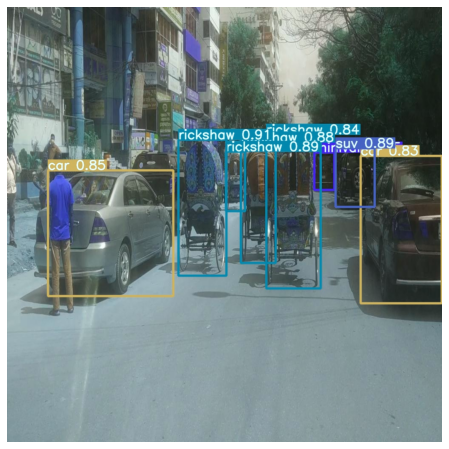

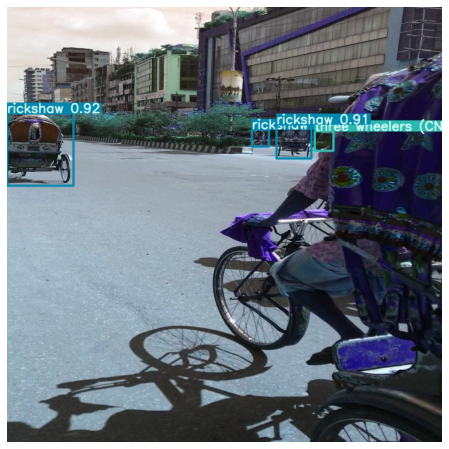

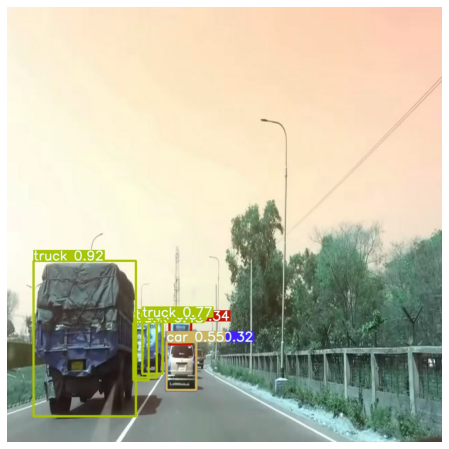

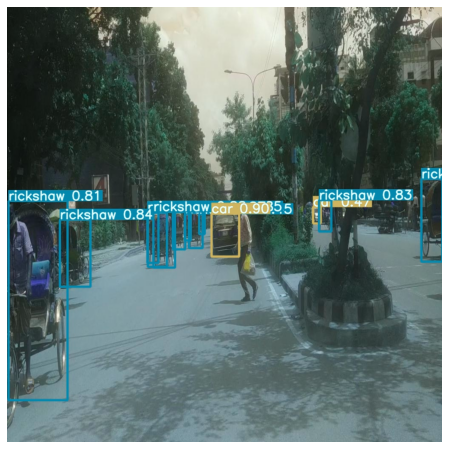

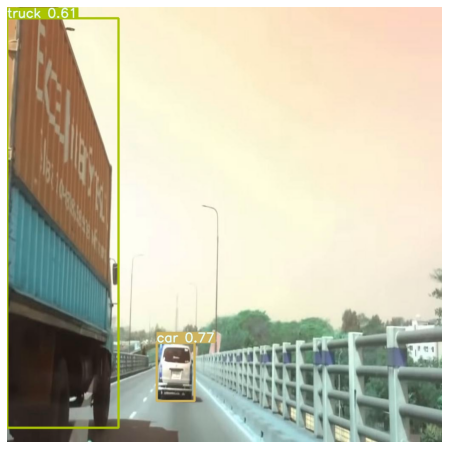

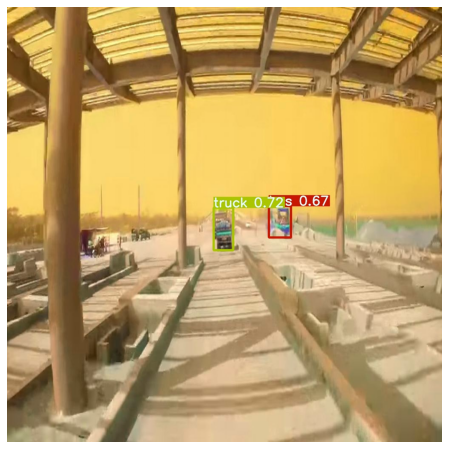

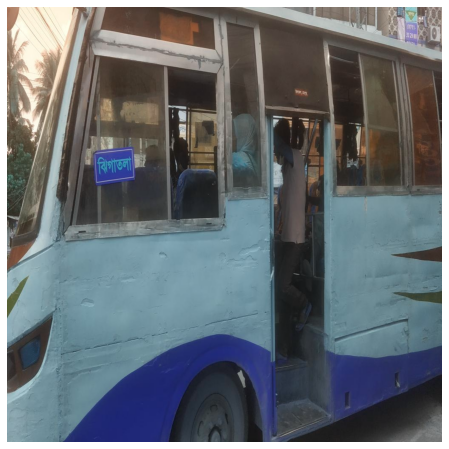

In [ ]:
# visualization
import os,cv2
import matplotlib.pyplot as plt
files5=glob.glob(os.path.join("inference/output", "*.jpg"))
files5 = files5[:10]
for img in files5:
    img=cv2.imread(img)
    #ploting image with predicted class name        
    plt.figure(figsize = (8,8))
    plt.imshow(img)
    plt.axis('off')
    plt.show()  

## All the results are in folder: /content/yolov5/inference/output 

In [ ]:
# this will test the accuracy on test set
# run after completing 100 epochs, change the weight path accordingly and use best.pt
# Our best model was an ensemble of 11 models with different yolov5 model configurations and optimizers and corresponding evolved hyperparameters
!python test.py --data dhakaai.yaml --task test \
                --weights '/content/drive/My Drive/mediumhyp/exp0/weights/best.pt' '/content/drive/My Drive/YOLOv5xtra/exp0/weights/best.pt' \
                '/content/drive/My Drive/YOLOv5large_adam_hyp_evolved_adam/exp0/weights/best.pt' \
                '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedadaml_YOLOv5l_Combined_Clean/exp0/weights/best.pt' \
                '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedadamx_YOLOv5x_Combined_Clean/exp0/weights/best.pt' \
                '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedsgdl_YOLOv5l_Combined_Clean/exp0/weights/best.pt' \
                '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedsgdx_YOLOv5x_Combined_Clean/exp0/weights/best.pt'\
                '/content/drive/My Drive/largehyp/exp0/weights/best.pt' '/content/drive/My Drive/YOLOv5large_hyp_evolved/exp0/weights/best.pt' \
                '/content/drive/My Drive/YOLOv5xtra_hyp_evolved/exp0/weights/best.pt' '/content/drive/My Drive/YOLOv5xtra_hyp_evolved_adam/exp0/weights/best.pt' \
                --img-size 1024 --iou-thres=0.6 --conf-thres 0.3 --augment --verbose \
                --save-dir '/content/drive/My Drive/mediumevol/test'

Namespace(augment=True, batch_size=32, conf_thres=0.3, data='./data/dhakaai.yaml', device='', img_size=1024, iou_thres=0.6, save_conf=False, save_dir='/content/drive/My Drive/mediumevol/test', save_json=False, save_txt=False, single_cls=False, task='test', verbose=True, weights=['/content/drive/My Drive/mediumhyp/exp0/weights/best.pt', '/content/drive/My Drive/YOLOv5xtra/exp0/weights/best.pt', '/content/drive/My Drive/YOLOv5large_adam_hyp_evolved_adam/exp0/weights/best.pt', '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedadaml_YOLOv5l_Combined_Clean/exp0/weights/best.pt', '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedadamx_YOLOv5x_Combined_Clean/exp0/weights/best.pt', '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedsgdl_YOLOv5l_Combined_Clean/exp0/weights/best.pt', '/content/drive/My Drive/Hisham Vaia/DhakaAI 2020/hypevolvedsgdx_YOLOv5x_Combined_Clean/exp0/weights/best.pt', '/content/drive/My Drive/largehyp/exp0/weights/best.pt', '/content/drive/My

# Sample example to create submission file



In [ ]:
# run after completing 100 epochs
# Plotting bbox ffrom the .txt file output from yolo #
import pandas as pd
import numpy as np
lut={"ambulance": 0,
     "auto rickshaw": 1,
     "bicycle": 2,
     "bus": 3,
     "car": 4,
     "garbagevan": 5,
     "human hauler": 6,
     "minibus": 7,
     "minivan": 8,
     "motorbike": 9,
     "pickup": 10,
     "army vehicle": 11,
     "policecar": 12,
     "rickshaw": 13,
     "scooter": 14,
     "suv": 15,
     "taxi": 16,
     "three wheelers (CNG)": 17,
     "truck": 18,
     "van": 19,
     "wheelbarrow": 20
     }
# function to return key for any value 
def get_key(val): 
    for key, value in lut.items(): 
        if val == value: 
             return key

df = pd.DataFrame(columns = ['image_id','class','score','xmin','ymin','xmax','ymax'])

files4=glob.glob(os.path.join("/content/yolov5/inference/output/", "*.txt"))

## Provide the location of the output .txt file ##
for f in files4:
    a_file = open(f, "r")

    # Stripping data from the txt file into a list #
    list_of_lists = []
    for line in a_file:
        stripped_line = line.strip()
        line_list = stripped_line.split()
        list_of_lists.append(line_list)
    a_file.close()

    # Conversion of str to int #
    stage1 = []
    for i in range(0, len(list_of_lists)):
        test_list = list(map(float, list_of_lists[i])) 
        stage1.append(test_list)

    # Denormalizing # 
    stage2 = []
    mul = [1,1,1024,1024,1024,1024] #[constant, conf, image_width, image_height, image_width, image_height]
    for x in stage1:
        c,p,xx,yy,w,h = x[0]*mul[0], x[1]*mul[1], x[2]*mul[2], x[3]*mul[3], x[4]*mul[4], x[5]*mul[5]    
        stage2.append([c,p,xx,yy,w,h])

    # Convert (x_center, y_center, width, height) --> (x_min, y_min, width, height) #
    stage_final = []
    for x in stage2:
        c,p,xx,yy,w,h = int(x[0])*1, x[1]*1, (x[2]-(x[4]/2)) , (x[3]-(x[5]/2)), x[4]*1, x[5]*1
        xx1 = xx + w
        yy1 = yy + h
        
        #stripping image id
        head,tail=os.path.split(f)
        id = os.path.splitext(tail)[0]+'.jpg'
        #getting object name
        clss = get_key(c)
        to_append = [id,clss,p,xx,yy,xx1,yy1]
        df_length = len(df)
        df.loc[df_length] = to_append
df['width'] = 1024
df['height'] = 1024

### Submission file structure

In the submission file you need to have to following headers with values



*   image_id
*   class
*   score
*   xmin
*   ymin
*   xmax
*   ymax
*   height
*   width

**Remember all the test images are rescaled into 1024x1024 so the bounding boxes must be scaled for 1024x1024 image size**




In [ ]:
df.head()

,image_id,class,score,xmin,ymin,xmax,ymax,width,height
0,sabiha(152)_jpg.rf.9b892eefb41c2860e3313ddb260...,rickshaw,0.330566,480.000358,492.000256,525.000346,673.000448,1024,1024
1,sabiha(152)_jpg.rf.9b892eefb41c2860e3313ddb260...,rickshaw,0.366211,373.999616,467.000320,512.000000,698.999808,1024,1024
2,sabiha(152)_jpg.rf.9b892eefb41c2860e3313ddb260...,rickshaw,0.447998,2.000026,500.000358,37.000038,544.000410,1024,1024
3,sabiha(152)_jpg.rf.9b892eefb41c2860e3313ddb260...,car,0.733887,0.000000,515.999846,41.999974,607.999898,1024,1024
4,sabiha(152)_jpg.rf.9b892eefb41c2860e3313ddb260...,rickshaw,0.755859,482.999603,489.999872,584.999629,648.000000,1024,1024


In [ ]:
df.to_csv('submission_fen2.csv', index=False)
#!cp 'submission_fen.csv' '/content/drive/My Drive/'

In [ ]:
from google.colab import files
files.download('submission_fen2.csv') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>